# **Dermatology Pigmented Lesion Classification**

By: Alex Liu

The HAM10000 dataset (https://arxiv.org/abs/1803.10417) was published in spring of this year.  In the words of the authors:

> We collected dermatoscopic images from different populations acquired and stored by different modalities. Given this diversity we had to apply different acquisition and cleaning methods and developed semi-automatic workflows utilizing specifically trained neural networks. The final dataset consists of 11788 dermatoscopic images, of which 10010 will be released as a training set for academic machine learning purposes and will be publicly available through the ISIC archive. This benchmark dataset can be used for machine learning and for comparisons with human experts. Cases include a representative collection of all important diagnostic categories in the realm of pigmented lesions. More than 50% of lesions have been confirmed by pathology, the ground truth for the rest of the cases was either follow-up, expert consensus, or confirmation by in-vivo confocal microscopy.

 I created this notebook to practice both exploratory data analysis and also to create my first deep convolutional network using Kera.
 
 Gratitude to:
 Kevin Mader (Kaggle) for uploading this dataset and providing instructions for loading the images.

## **Initialization**

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
np.random.seed(123)

from sklearn.metrics import confusion_matrix
import itertools

import tensorflow as tf
import tensorflow.keras 
from tensorflow.keras.utils import to_categorical 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D

from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [3]:
base_skin_dir = 'archive' 
# os.path.join('..', 'input')

# Merge images from both folders into one dictionary

imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(base_skin_dir, '*', '*.jpg'))}

# This dictionary is useful for displaying more human-friendly labels later on

lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'bkl': 'Benign keratosis-like lesions ',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}

In [4]:
# Read in the csv of metadata

tile_df = pd.read_csv(os.path.join(base_skin_dir, 'HAM10000_metadata.csv'))

# Create some new columns (path to image, human-readable name) and review them

tile_df['path'] = tile_df['image_id'].map(imageid_path_dict.get)
tile_df['cell_type'] = tile_df['dx'].map(lesion_type_dict.get) 
tile_df['cell_type_idx'] = pd.Categorical(tile_df['cell_type']).codes
tile_df.sample(5)

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx
9725,HAM_0004376,ISIC_0024843,akiec,histo,70.0,female,face,archive\HAM10000_images_part_1\ISIC_0024843.jpg,Actinic keratoses,0
6059,HAM_0003024,ISIC_0024768,nv,follow_up,35.0,female,trunk,archive\HAM10000_images_part_1\ISIC_0024768.jpg,Melanocytic nevi,4
4540,HAM_0001659,ISIC_0026564,nv,follow_up,35.0,male,lower extremity,archive\HAM10000_images_part_1\ISIC_0026564.jpg,Melanocytic nevi,4
3817,HAM_0004625,ISIC_0029346,nv,follow_up,40.0,male,upper extremity,archive\HAM10000_images_part_2\ISIC_0029346.jpg,Melanocytic nevi,4
7914,HAM_0000443,ISIC_0034271,nv,histo,35.0,female,back,archive\HAM10000_images_part_2\ISIC_0034271.jpg,Melanocytic nevi,4


In [5]:
tile_df['path'][10002]

'archive\\HAM10000_images_part_2\\ISIC_0032947.jpg'

## **Exporatory Data Analysis**

In [6]:
# Get general statistics for the dataset

tile_df.describe(exclude=[np.number])

,lesion_id,image_id,dx,dx_type,sex,localization,path,cell_type
count,10015,10015,10015,10015,10015,10015,10015,10015
unique,7470,10015,7,4,3,15,10015,7
top,HAM_0000835,ISIC_0031270,nv,histo,male,back,archive\HAM10000_images_part_1\ISIC_0025037.jpg,Melanocytic nevi
freq,6,1,6705,5340,5406,2192,1,6705


<AxesSubplot:>

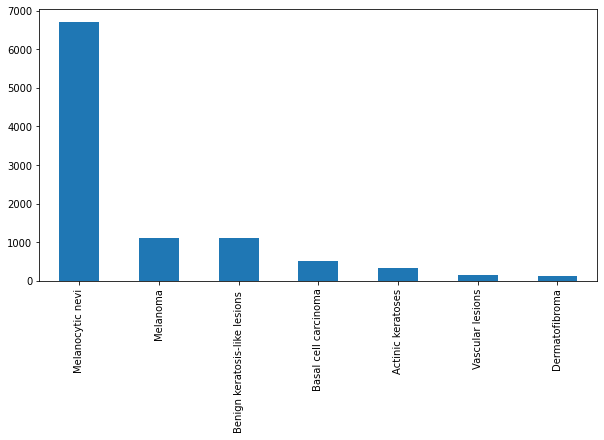

In [7]:
# Let's see the distribution of different cell types

fig, ax1 = plt.subplots(1, 1, figsize= (10, 5))
tile_df['cell_type'].value_counts().plot(kind='bar', ax=ax1)

<AxesSubplot:>

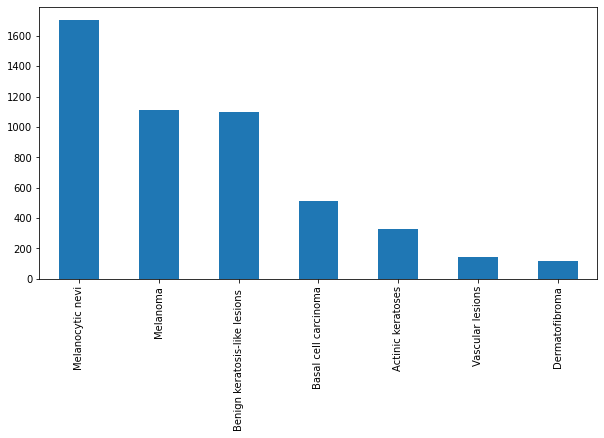

In [8]:
# Too many melanocytic nevi - let's balance it a bit!

tile_df = tile_df.drop(tile_df[tile_df.cell_type_idx == 4].iloc[:5000].index)
fig, ax1 = plt.subplots(1, 1, figsize= (10, 5))
tile_df['cell_type'].value_counts().plot(kind='bar', ax=ax1)

Ahh, that's better.

<AxesSubplot:>

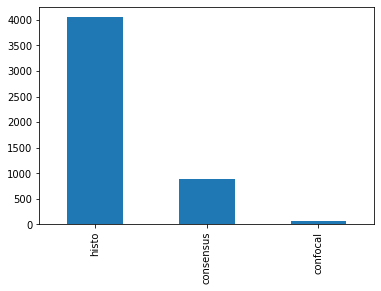

In [9]:
# The 'dx_type' field is interesting - 
# it seems to describe the approach that real experts used to label the samples.

tile_df['dx_type'].value_counts().plot(kind='bar')

<AxesSubplot:>

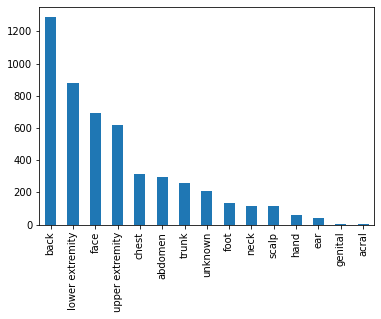

In [10]:
# Let's see the distribution of localization of the images

tile_df['localization'].value_counts().plot(kind='bar')

<AxesSubplot:>

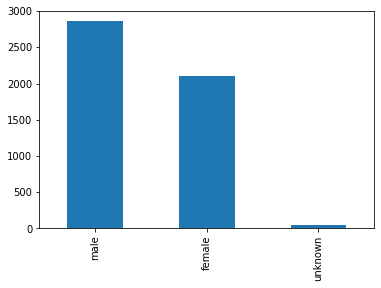

In [11]:
# And finally the distribution of the sexes

tile_df['sex'].value_counts().plot(kind='bar')

**Import and resize images**

In [12]:
# Load in all of the images into memory - this will take a while.  
# We also do a resize step because the original dimensions of 450 * 600 * 3 was too much for TensorFlow

tile_df['image'] = tile_df['path'].map(lambda x: np.asarray(Image.open(x).resize((100,75))))

**Seeing is believing...**

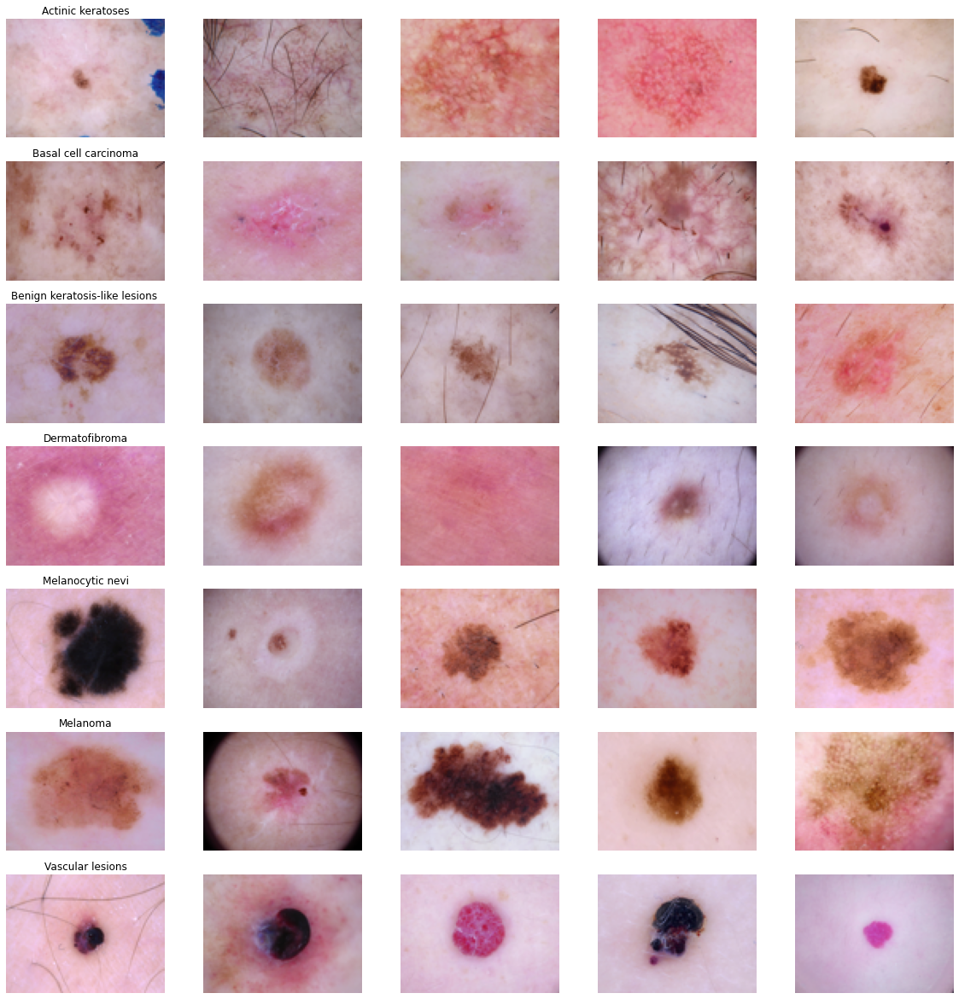

In [13]:
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         tile_df.sort_values(['cell_type']).groupby('cell_type')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=2018).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')
fig.savefig('category_samples.png', dpi=300)

In [14]:
# See the image size distribution - should just return one row (all images are uniform)
tile_df['image'].map(lambda x: x.shape).value_counts()

(75, 100, 3)    5015
Name: image, dtype: int64

**Color channel analysis**

How do the normalized color samples vary across different types of skin diseases?

In [15]:
rgb_info_df = tile_df.apply(lambda x: pd.Series({'{}_mean'.format(k): v for k, v in 
                                  zip(['Red', 'Green', 'Blue'], 
                                      np.mean(x['image'], (0, 1)))}),1)
gray_col_vec = rgb_info_df.apply(lambda x: np.mean(x), 1)
for c_col in rgb_info_df.columns:
    rgb_info_df[c_col] = rgb_info_df[c_col]/gray_col_vec
rgb_info_df['Gray_mean'] = gray_col_vec
rgb_info_df.sample(10)

,Red_mean,Green_mean,Blue_mean,Gray_mean
1541,1.063780,0.921682,1.014538,162.966667
540,1.093374,0.905133,1.001493,145.359111
8368,1.204902,0.860428,0.934670,150.262044
9482,1.137728,0.951853,0.910419,184.185333
992,1.334270,0.829517,0.836212,137.116044
216,1.179945,0.929202,0.890853,172.078133
8739,1.144673,0.897228,0.958099,167.985511
9536,1.134049,0.842735,1.023216,162.824844
9716,1.105729,0.945488,0.948783,195.887333
9213,1.130159,0.905562,0.964279,181.727644


In [16]:
for c_col in rgb_info_df.columns:
    tile_df[c_col] = rgb_info_df[c_col].values

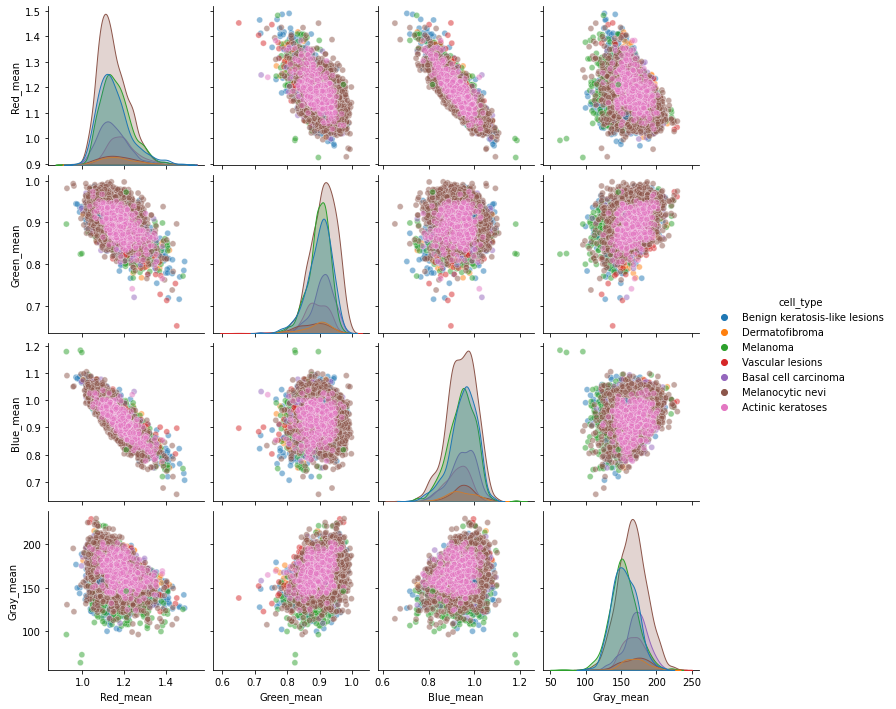

In [17]:
sns.pairplot(tile_df[['Red_mean', 'Green_mean', 'Blue_mean', 'Gray_mean', 'cell_type']], 
             hue='cell_type', plot_kws = {'alpha': 0.5})

## **Deep Convolutional Classifier**

We are going to build a multi-class classifier using a deep convolutional network architecture.

**Let's create our training and test sets.**

**Assign the data structures we are going to pass into the classifier.**

In [18]:
y = tile_df.cell_type_idx

from sklearn.model_selection import train_test_split
x_train_o, x_test_o, y_train_o, y_test_o = train_test_split(tile_df, y, test_size=0.25)

x_train = np.asarray(x_train_o['image'].tolist())
x_test = np.asarray(x_test_o['image'].tolist())

x_train_mean = np.mean(x_train)
x_train_std = np.std(x_train)

x_test_mean = np.mean(x_test)
x_test_std = np.std(x_test)

x_train = (x_train - x_train_mean)/x_train_std
x_test = (x_test - x_test_mean)/x_test_std

# Perform one-hot encoding on the labels
y_train = to_categorical(y_train_o, num_classes = 7)
y_test = to_categorical(y_test_o, num_classes = 7)

<AxesSubplot:>

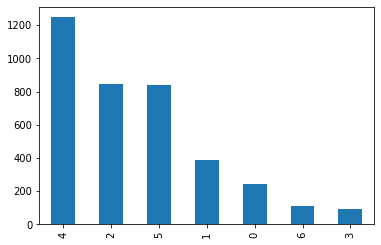

In [19]:
y_train_o.value_counts().plot(kind='bar')

<AxesSubplot:>

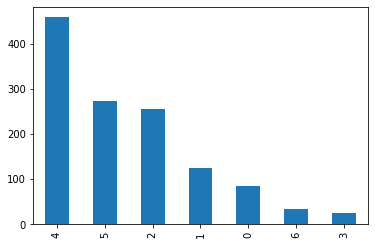

In [20]:
y_test_o.value_counts().plot(kind='bar')

**Define our deep convolutional network architecture**

In [28]:
input_shape = (75, 100, 3)
num_classes = 7

model = Sequential()
model.add(Conv2D(128, kernel_size=(5, 5),
                 activation= tf.keras.layers.LeakyReLU(alpha=0.1),
                 input_shape=input_shape))
model.add(Conv2D(64, (4, 4), activation=tf.keras.layers.LeakyReLU(alpha=0.1)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Conv2D(32, (3, 3), activation=tf.keras.layers.LeakyReLU(alpha=0.1)))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation=tf.keras.layers.LeakyReLU(alpha=0.1)))
model.add(Dropout(0.4))
model.add(Dense(num_classes, activation='softmax'))

### Densenet 121 Model

In [21]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Dense
from tensorflow.keras.layers import AvgPool2D, GlobalAveragePooling2D, MaxPool2D
from tensorflow.keras.models import Model
from tensorflow.keras.layers import ReLU, concatenate
import tensorflow.keras.backend as K

# Creating Densenet121
def densenet(input_shape, n_classes, filters = 32):
    
    #batch norm + relu + conv
    def bn_rl_conv(x,filters,kernel=1,strides=1):
        
        x = BatchNormalization()(x)
        x = ReLU()(x)
        x = Conv2D(filters, kernel, strides=strides,padding = 'same')(x)
        return x
    
    def dense_block(x, repetition):
        
        for _ in range(repetition):
            y = bn_rl_conv(x, 4*filters)
            y = bn_rl_conv(y, filters, 3)
            x = concatenate([y,x])
        return x
        
    def transition_layer(x):
        
        x = bn_rl_conv(x, K.int_shape(x)[-1] //2 )
        x = AvgPool2D(2, strides = 2, padding = 'same')(x)
        return x
    
    input = Input (input_shape)
    x = Conv2D(64, 7, strides = 2, padding = 'same')(input)
    x = MaxPool2D(3, strides = 2, padding = 'same')(x)
    
    for repetition in [6,12,24,16]:
        
        d = dense_block(x, repetition)
        x = transition_layer(d)    
    
    x = GlobalAveragePooling2D()(d)
    output = Dense(n_classes, activation = 'softmax')(x)
    
    model = Model(input, output)
    return model
    
input_shape = 75, 100, 3
n_classes = 7
model = densenet(input_shape,n_classes)
model.summary()

[0][0]             
__________________________________________________________________________________________________
batch_normalization_93 (BatchNo (None, 3, 4, 608)    2432        concatenate_44[0][0]             
__________________________________________________________________________________________________
re_lu_93 (ReLU)                 (None, 3, 4, 608)    0           batch_normalization_93[0][0]     
__________________________________________________________________________________________________
conv2d_97 (Conv2D)              (None, 3, 4, 128)    77952       re_lu_93[0][0]                   
__________________________________________________________________________________________________
batch_normalization_94 (BatchNo (None, 3, 4, 128)    512         conv2d_97[0][0]                  
__________________________________________________________________________________________________
re_lu_94 (ReLU)                 (None, 3, 4, 128)    0           batch_normalization_94[0

In [29]:
model.compile(loss=tf.keras.losses.categorical_crossentropy,
              optimizer=tf.keras.optimizers.Adadelta(),
              metrics=['accuracy'])

# model.compile(loss=tf.keras.losses.categorical_crossentropy,
#               optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
#               metrics=['accuracy'])
              
# Todo: Try different optimizers like RMS Prop

### Basic 3 layer CNN model

In [30]:
batch_size = 32 # Todo: experiment with this variable more
epochs = 15

history = model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_test, y_test))

score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Epoch 1/15
118/118 [==============================] - 8s 66ms/step - loss: 1.8749 - accuracy: 0.2768 - val_loss: 1.7823 - val_accuracy: 0.3868
Epoch 2/15
118/118 [==============================] - 8s 65ms/step - loss: 1.7301 - accuracy: 0.3539 - val_loss: 1.6449 - val_accuracy: 0.3955
Epoch 3/15
118/118 [==============================] - 8s 64ms/step - loss: 1.6402 - accuracy: 0.3534 - val_loss: 1.5736 - val_accuracy: 0.3947
Epoch 4/15
118/118 [==============================] - 8s 65ms/step - loss: 1.5942 - accuracy: 0.3566 - val_loss: 1.5380 - val_accuracy: 0.3963
Epoch 5/15
118/118 [==============================] - 8s 66ms/step - loss: 1.5711 - accuracy: 0.3613 - val_loss: 1.5171 - val_accuracy: 0.4035
Epoch 6/15
118/118 [==============================] - 8s 66ms/step - loss: 1.5460 - accuracy: 0.3800 - val_loss: 1.5035 - val_accuracy: 0.4067
Epoch 7/15
118/118 [==============================] - 8s 66ms/step - loss: 1.5460 - accuracy: 0.3784 - val_loss: 1.4912 - val_accuracy: 0.4067

In [26]:
model.save('60epmodel.h5')

In [27]:
model = tf.keras.models.load_model('60epmodel.h5')

In [29]:
model.evaluate(x_train, y_train, verbose=1)

118/118 [==============================] - 3s 27ms/step - loss: 0.0617 - accuracy: 0.9777


[0.06172164902091026, 0.9776655435562134]

## Model Validation

**Loss and accuracy curves for training and test sets.**

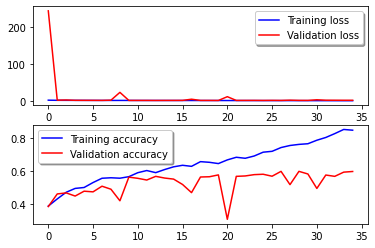

In [24]:
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="Validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

**Confusion matrix**

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Predict the values from the validation dataset
y_pred = model.predict(x_test)
# Convert predictions classes to one hot vectors 
y_pred_classes = np.argmax(y_pred,axis = 1) 
# Convert validation observations to one hot vectors
y_true = np.argmax(y_test,axis = 1) 
# compute the confusion matrix
confusion_mtx = confusion_matrix(y_true, y_pred_classes) 
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(7)) 